In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import dandelion as ddl
import sys
sys.path.append('/home/jovyan/NC_study/scanpy/scripts')
from tools import cmp, exportDEres
sc.logging.print_versions()

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/NC_study/scanpy'))

scanpy==1.5.1 anndata==0.7.4 umap==0.4.6 numpy==1.19.1 scipy==1.5.1 pandas==1.0.5 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.8.2 leidenalg==0.8.1


In [2]:
# read in files
adata_all = sc.read_h5ad('out/adata_combined.h5ad')
adata_all

AnnData object with n_obs × n_vars = 67873 × 828
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label', 'broad_label', 'leiden_R', 'leiden_label', 'leiden_B'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'age_group_colors', 'broad_label_colors', 'cohort_colors', 'fine_label_colors', 'gender_colors', 'leiden', 'leiden_B_colors', 'leiden_R_colors', 'leiden_colors', 'leiden_label_colors', 'neighbors', 'patient_colors', 'pca', 'sampletype_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

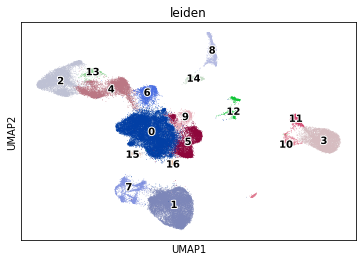

In [3]:
sc.pl.umap(adata_all, color = ['leiden'], legend_loc = 'on data', legend_fontoutline=2)

### Subset to only B cell cluster i.e. cluster 1

In [4]:
adata = adata_all[(adata_all.obs['leiden'].isin(['1']))]
adata

View of AnnData object with n_obs × n_vars = 12936 × 828
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label', 'broad_label', 'leiden_R', 'leiden_label', 'leiden_B'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'age_group_colors', 'cohort_colors', 'gender_colors', 'leiden', 'leiden_B_colors', 'leiden_R_colors', 'leiden_label_colors', 'neighbors', 'patient_colors', 'pca', 'sampletype_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [5]:
# reset the labels to just call them B cells for now
adata.obs['broad_label'] = adata.obs['broad_label'].astype('object')
adata.obs['broad_label'] = 'B'
adata.obs['fine_label'] = adata.obs['fine_label'].astype('object')
adata.obs['fine_label'] = 'B'

Trying to set attribute `.obs` of view, copying.


In [6]:
# recluster MNPs
adata = sc.AnnData(X = adata.raw.X, obs = adata.obs, var = adata.raw.var, uns = adata.uns, obsm = adata.obsm, obsp = adata.obsp)
adata.raw = adata
adata

AnnData object with n_obs × n_vars = 12936 × 18504
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label', 'broad_label', 'leiden_R', 'leiden_label', 'leiden_B'
    uns: 'age_group_colors', 'cohort_colors', 'gender_colors', 'leiden', 'leiden_B_colors', 'leiden_R_colors', 'leiden_label_colors', 'neighbors', 'patient_colors', 'pca', 'sampletype_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

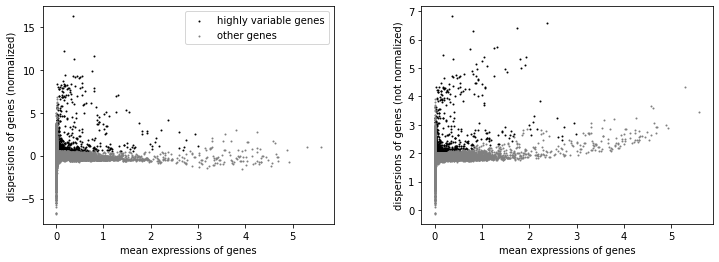

In [7]:
# find highly variable genes
sc.pp.highly_variable_genes(adata, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(adata)

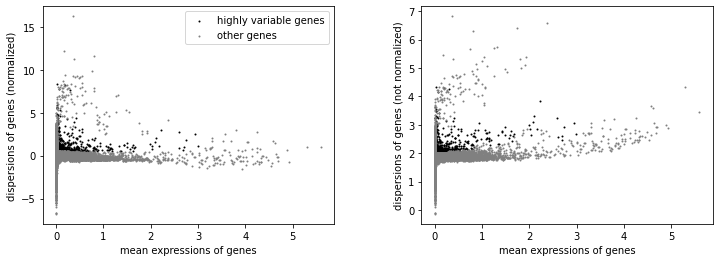

In [8]:
## remove IGHV/IGKV/IGLV from the highly variable genes
import re
for i in adata.var.index:
    if re.search('^IG[HKL]V', i):
        adata.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(adata)

In [9]:
import multiprocessing
# subset to highly variable
adata = adata[:, adata.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'], n_jobs=multiprocessing.cpu_count()-1)
sc.pp.scale(adata, max_value = 10)

Trying to set attribute `.obs` of view, copying.
... storing 'fine_label' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'broad_label' as categorical


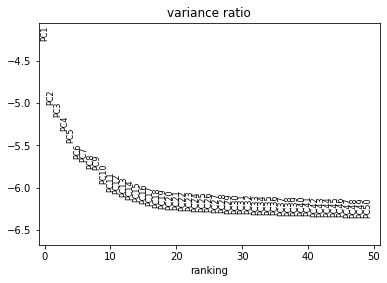

In [10]:
# Principal component analysis
sc.tl.pca(adata, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(adata, log = True, n_pcs = 50)

In [11]:
# run BBKNN
sc.external.pp.bbknn(adata, batch_key = 'patient', n_pcs = 30)

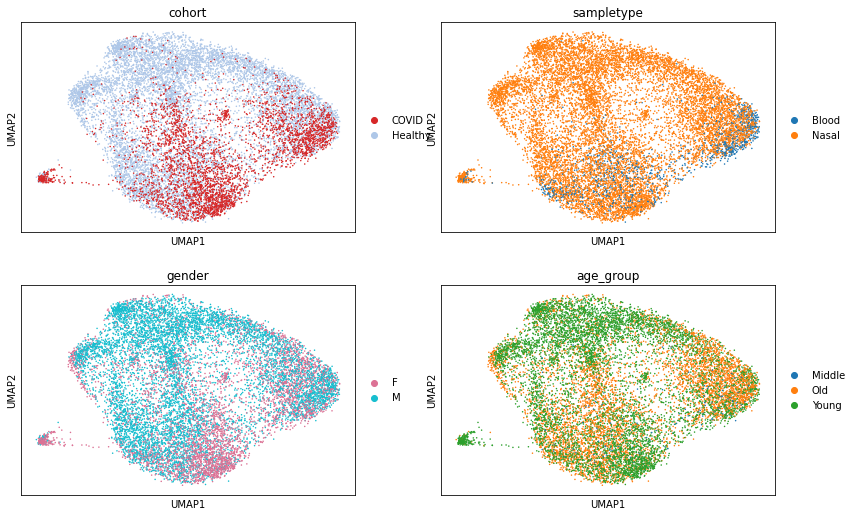

In [12]:
# UMAP
sc.tl.umap(adata, n_components = 2, min_dist = 0.1)
sc.pl.umap(adata, color=['cohort', 'sampletype', 'gender', 'age_group'], ncols =2)

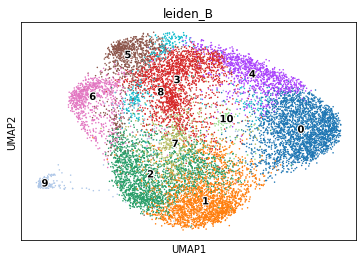

In [13]:
# run clustering
sc.tl.leiden(adata, resolution = 1, key_added = 'leiden_B')
sc.pl.umap(adata, color=['leiden_B'], legend_loc = 'on data', legend_fontoutline = 2, color_map = cmp())

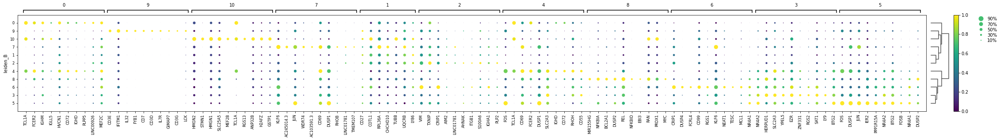

In [14]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden_B', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(adata, min_fold_change=1)
sc.tl.dendrogram(adata, groupby = 'leiden_B')
sc.pl.rank_genes_groups_dotplot(adata, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

In [15]:
# update the original object to highlight the doublets
adata.obs['broad_label'] = adata.obs['broad_label'].astype('object')
adata.obs['fine_label'] = adata.obs['fine_label'].astype('object')
for i in adata.obs_names:
    if adata.obs.loc[i, 'leiden_B'] == '9':
        adata.obs.at[i, 'broad_label'] = 'doublet'
        adata.obs.at[i, 'fine_label'] = 'doublet'
# update the original object
adata_all.obs['broad_label'] = adata_all.obs['broad_label'].astype('object')
adata_all.obs['fine_label'] = adata_all.obs['fine_label'].astype('object')
adata_all.obs['broad_label'].update(adata.obs['broad_label'].astype('object'))
adata_all.obs['fine_label'].update(adata.obs['fine_label'].astype('object'))

### Recluster again without the obvious doublets

In [16]:
# subset to B cells
adata = adata_all[adata_all.obs['leiden'].isin(['1'])]
adata = adata[~(adata.obs['broad_label'] == 'doublet')]
adata

View of AnnData object with n_obs × n_vars = 12660 × 828
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label', 'broad_label', 'leiden_R', 'leiden_label', 'leiden_B'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'age_group_colors', 'broad_label_colors', 'cohort_colors', 'fine_label_colors', 'gender_colors', 'leiden', 'leiden_B_colors', 'leiden_R_colors', 'leiden_label_colors', 'neighbors', 'patient_colors', 'pca', 'sampletype_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [17]:
# recluster MNPs
adata = sc.AnnData(X = adata.raw.X, obs = adata.obs, var = adata.raw.var, uns = adata.uns, obsm = adata.obsm, obsp = adata.obsp)
adata.raw = adata
adata

AnnData object with n_obs × n_vars = 12660 × 18504
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label', 'broad_label', 'leiden_R', 'leiden_label', 'leiden_B'
    uns: 'age_group_colors', 'broad_label_colors', 'cohort_colors', 'fine_label_colors', 'gender_colors', 'leiden', 'leiden_B_colors', 'leiden_R_colors', 'leiden_label_colors', 'neighbors', 'patient_colors', 'pca', 'sampletype_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

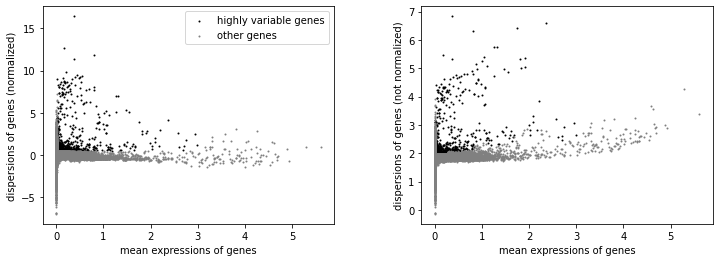

In [18]:
# find highly variable genes
sc.pp.highly_variable_genes(adata, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(adata)

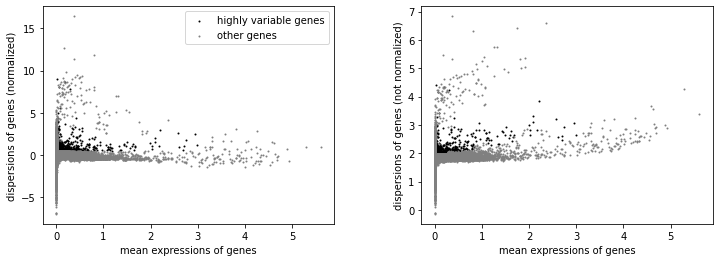

In [19]:
## remove IGHV/IGKV/IGLV from the highly variable genes
import re
for i in adata.var.index:
    if re.search('^IG[HKL]V', i):
        adata.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(adata)

In [20]:
import multiprocessing
# subset to highly variable
adata = adata[:, adata.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'], n_jobs=multiprocessing.cpu_count()-1)
sc.pp.scale(adata, max_value = 10)

Trying to set attribute `.obs` of view, copying.
... storing 'fine_label' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'broad_label' as categorical


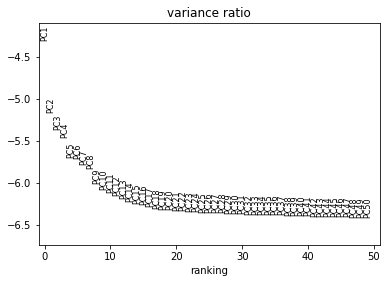

In [21]:
# Principal component analysis
sc.tl.pca(adata, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(adata, log = True, n_pcs = 50)

In [22]:
# run BBKNN
sc.external.pp.bbknn(adata, batch_key = 'patient', n_pcs = 30)

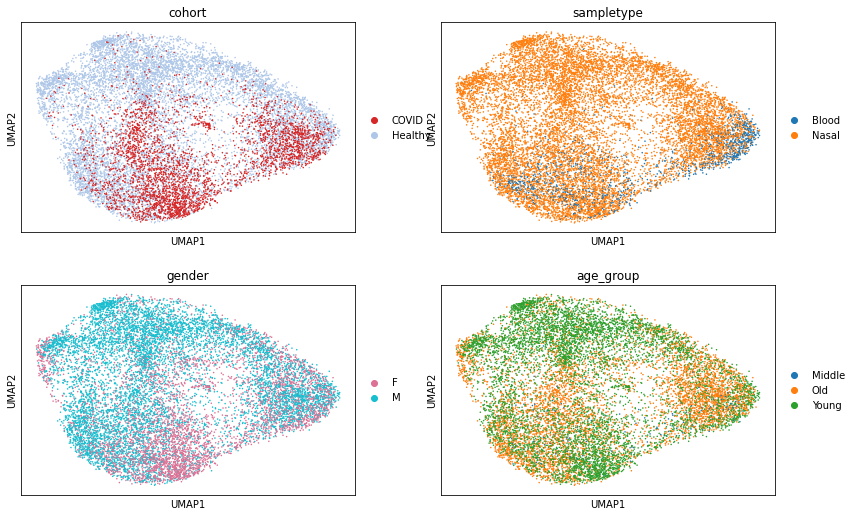

In [23]:
# UMAP
sc.tl.umap(adata, n_components = 2, min_dist = 0.1)
sc.pl.umap(adata, color=['cohort', 'sampletype', 'gender', 'age_group'], ncols =2)

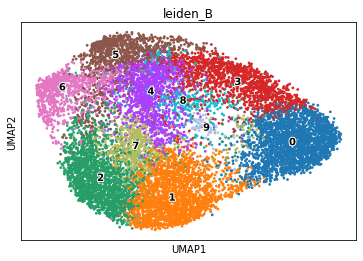

In [24]:
# run clustering
sc.tl.leiden(adata, resolution = 1, key_added = 'leiden_B')
sc.pl.umap(adata, color=['leiden_B'], legend_loc = 'on data', legend_fontoutline = 2, size =30)

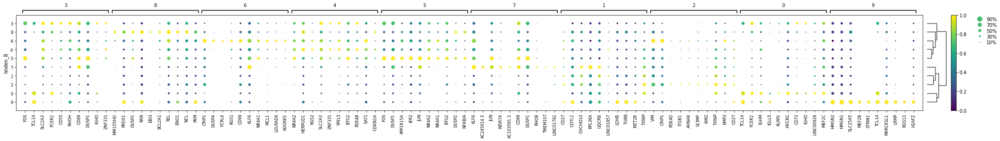

In [25]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden_B', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(adata, min_fold_change=1)
sc.tl.dendrogram(adata, groupby = 'leiden_B')
sc.pl.rank_genes_groups_dotplot(adata, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

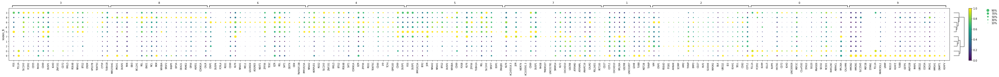

In [26]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes = 20, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

### Geneset tests
Use some gene sets to find out what's enriched by the clusters

In [27]:
df1 = pd.read_csv('datasets/GSE22886_BcellGenesets.txt', sep = '\t', index_col = None, header = 0, na_filter=None)
df1.columns

Index(['IgM_VS_IgA_MEMORY', 'IgA_VS_IgM_MEMORY', 'IgG_IgA_MEMORY_VS_NAIVE',
       'NAIVE_VS_IgG_IgA_MEMORY', 'IgM_MEMORY_VS_NAIVE',
       'NAIVE_VS_IgM_MEMORY'],
      dtype='object')

In [28]:
df2 = pd.read_csv('datasets/GSE38697_GSE12845_BcellGenesets.txt', sep = '\t', index_col = None, header = 0, na_filter=None)
df2.columns

Index(['GSE38697_DARK_VS_LIGHT', 'GSE38697_LIGHT_VS_DARK',
       'GSE12845_DARKZONE_GC_TONSIL_VS_NAIVE',
       'GSE12845_NAIVE_VS_DARKZONE_GC_TONSIL',
       'GSE12845_DARKZONE_GC_TONSIL_VS_PRE_GC',
       'GSE12845_PRE_GC_VS_DARKZONE_GC_TONSIL'],
      dtype='object')

In [29]:
df3 = pd.read_csv('datasets/Bcell_genesets.txt', sep='\t', header=0, index_col = None, na_filter=False)
df3.columns

Index(['MEMORY_vs_GC_UP', 'GC_vs_MEMORY_UP', 'NAIVE_vs_GC_UP',
       'GC_vs_NAIVE_UP', 'MEMORY_vs_NAIVE_UP', 'NAIVE_vs_MEMORY_UP'],
      dtype='object')

In [30]:
def geneset_score(self, genesets, groupby, figsize=(3, 4), cmap = 'viridis', col_cluster = True, row_cluster = True):
    import seaborn as sns
    for s in genesets:
        sc.tl.score_genes(self, [y for y in genesets[s] if y != ''], use_raw = True, score_name= str(s)+'_score')
    # calculate average enrichment score
    list1 = list(set(self.obs[groupby]))
    subset = self.obs[[groupby] + [str(s)+'_score' for s in genesets]]
    output = pd.DataFrame()
    for x in list1:
        subsetX = subset[subset[groupby] == x]
        outdict = {}
        for k in [str(s)+'_score' for s in genesets]:
            out = {k:np.mean(subsetX[k])}
            outdict.update(out)
        output = output.append(outdict, ignore_index=True)
    output.index = list1
    output = output[[str(s)+'_score' for s in genesets]]
    g = sns.clustermap(output.transpose(), standard_scale = 0, cmap=cmap, figsize=figsize, col_cluster = col_cluster, row_cluster = row_cluster)
    sc.pl.umap(self, color = [str(s)+'_score' for s in genesets], size = 80, ncols = 2)
    print(g)

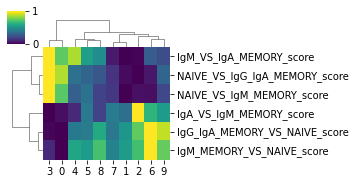

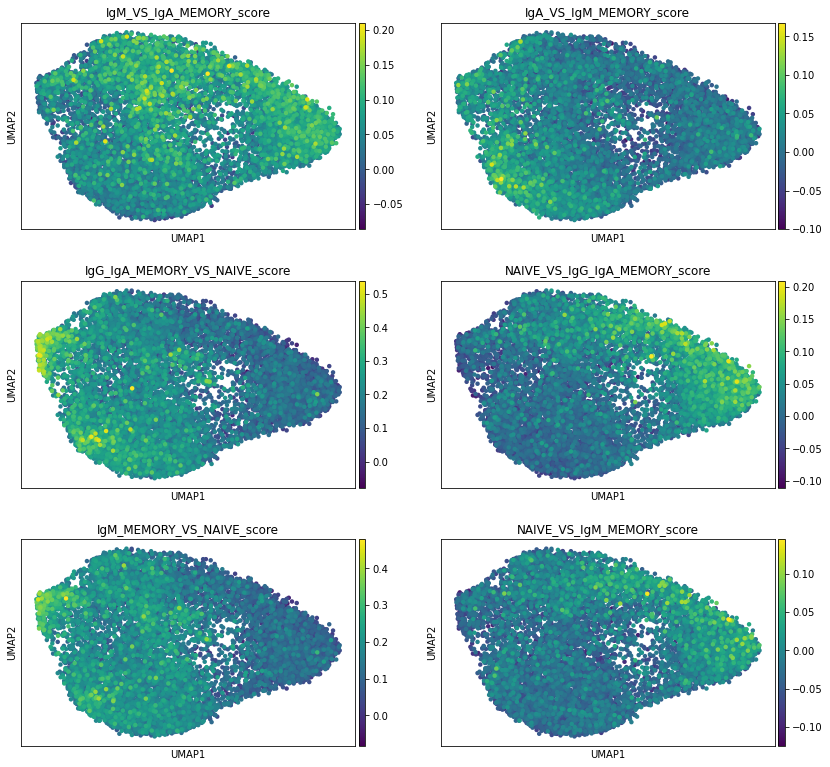

In [31]:
geneset_score(adata, df1, 'leiden_B', (5,2.5))

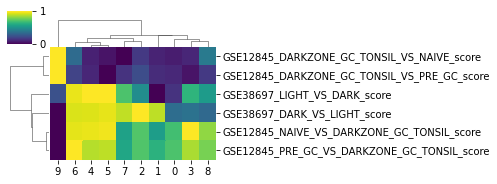

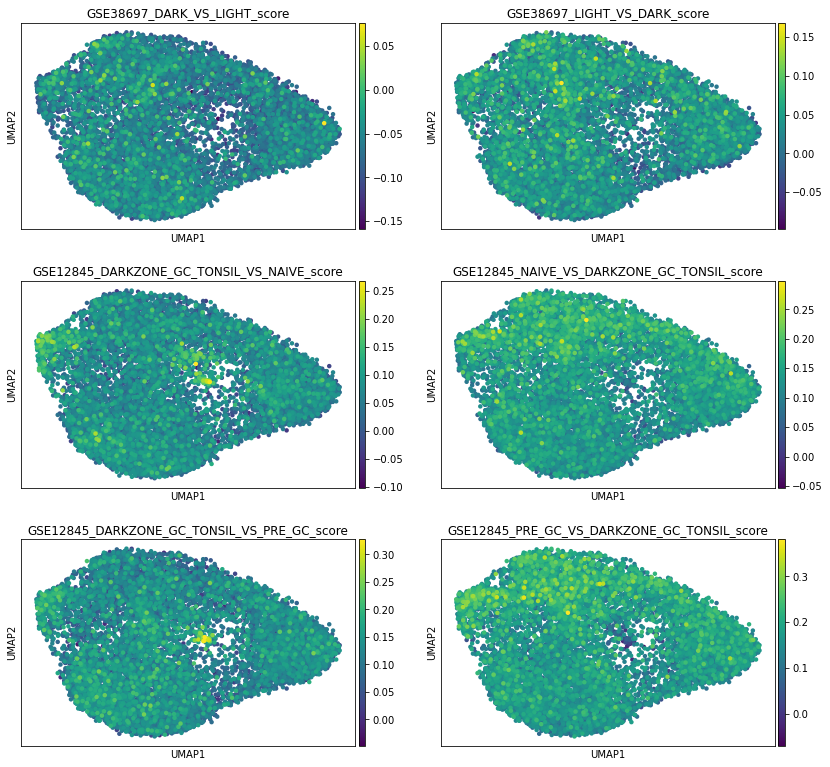

In [32]:
geneset_score(adata, df2, 'leiden_B', (7,2.5))

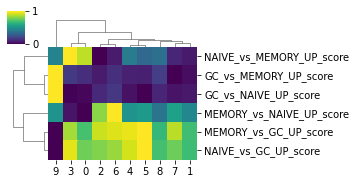

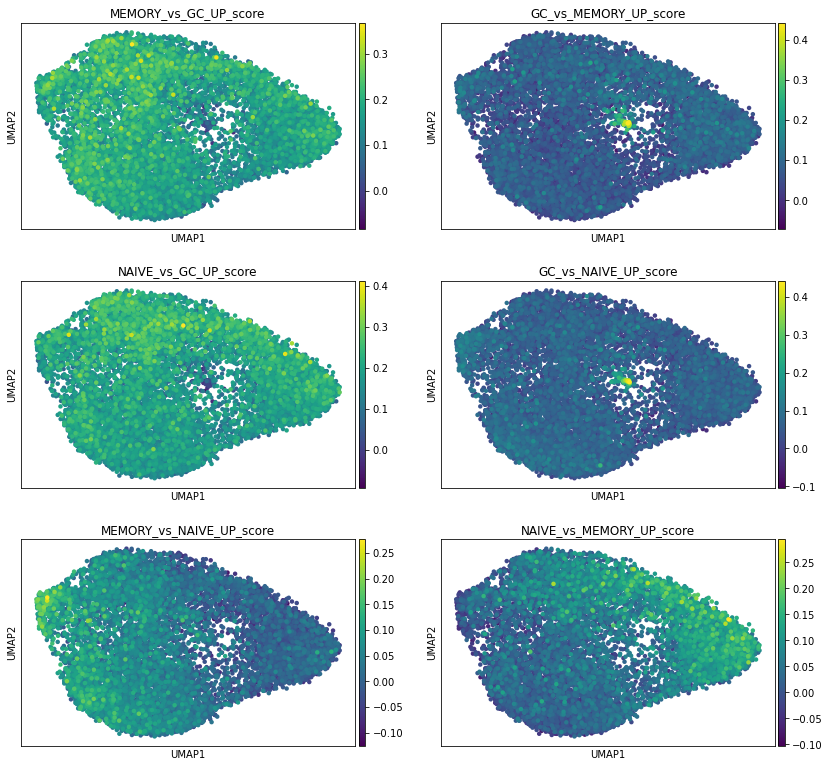

In [33]:
geneset_score(adata, df3, 'leiden_B', (5,2.5))

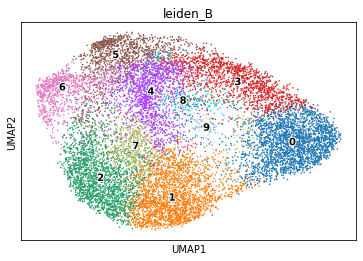

In [34]:
sc.pl.umap(adata, color=['leiden_B'], legend_loc = 'on data', legend_fontoutline = 2)

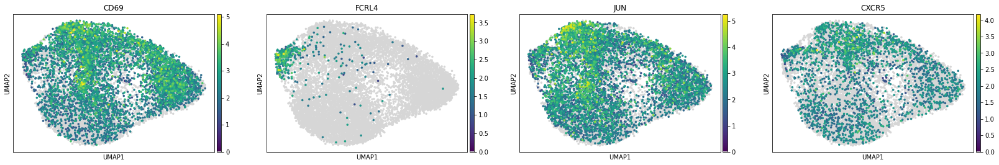

In [35]:
sc.pl.umap(adata, color=['CD69', 'FCRL4', 'JUN', 'CXCR5'], color_map = cmp(), size = 50)

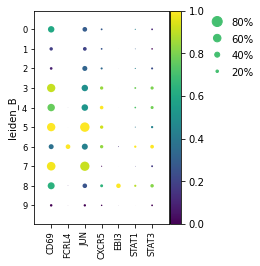

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[2.4499999999999997, 0, 0.2, 0.5, 0.25])

In [36]:
sc.pl.dotplot(adata, ['CD69', 'FCRL4', 'JUN', 'CXCR5', 'EBI3', 'STAT1', 'STAT3'], groupby = 'leiden_B', standard_scale = 'var', color_map = 'viridis')

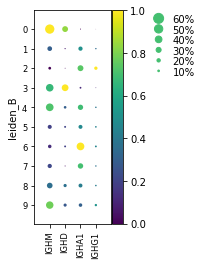

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[1.4, 0, 0.2, 0.5, 0.25])

In [37]:
sc.pl.dotplot(adata, ['IGHM', 'IGHD', 'IGHA1', 'IGHG1'], groupby = 'leiden_B', standard_scale = 'var', color_map = 'viridis')

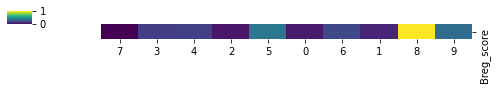

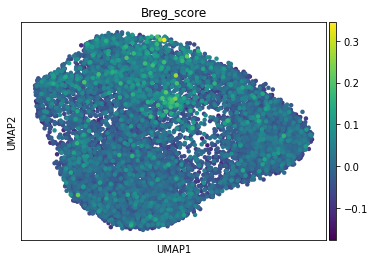

In [38]:
# from https://onlinelibrary.wiley.com/doi/epdf/10.1002/eji.201948489
bregtest = {'Breg':['GZMB', 'CCL4', 'UBE2G2', 'PPRC1', 'FOSL2', 'MAK16', 'CDK6', 'TRIP13', 'ACACA', 'URB2', 'MRTO4', 'LRP8', 'MYBL2', 'F5', 'TOMM40', 'SEC61A2', 'USP31', 'NFKBID', 'FLT1', 'DYRK3', 'KLF5', 'BCL2L1', 'DCUN1D5', 'NAE1', 'FARSA', 'LRRC32', 'PTPN2', 'DCUN1D2', 'DDX51', 'DUSP2', 'NOLC1', 'STOM', 'PSMD1', 'H2AFY', 'DHX33', 'ENPP1', 'FOSL1', 'CLSPN', 'NF2', 'HIVEP3', 'EIF3B', 'CAD', 'DUSP5', 'MAT2A', 'KIAA0100', 'LAPTM4B', 'SLC20A1', 'MT-ND6', 'NAT10', 'NABP2', 'HNF1B', 'RIOK1', 'TUBB6', 'MYBBP1A', 'WFDC2', 'ATP2A2', 'LLPH', 'B4GALT2', 'SCMH1', 'PDP2', 'NOP2']}
geneset_score(adata, bregtest, 'leiden_B', (7,1), col_cluster=False, row_cluster = False)

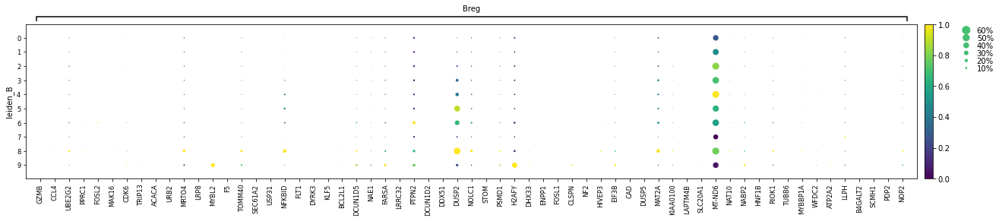

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[21.349999999999998, 0, 0.2, 0.5, 0.25])

In [39]:
sc.pl.dotplot(adata, bregtest, groupby = 'leiden_B', standard_scale = 'var', color_map = 'viridis')

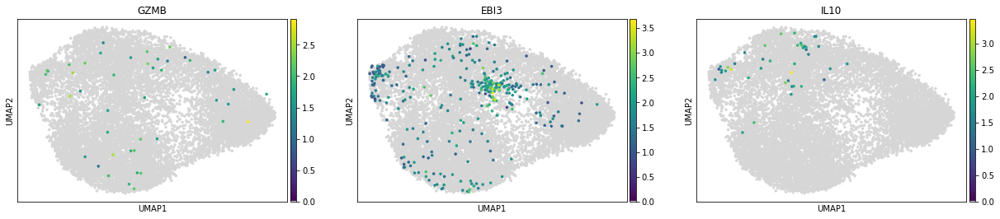

In [40]:
sc.pl.umap(adata, color=['GZMB', 'EBI3', 'IL10'], color_map = cmp(), size = 50)

... storing 'fine_label' as categorical


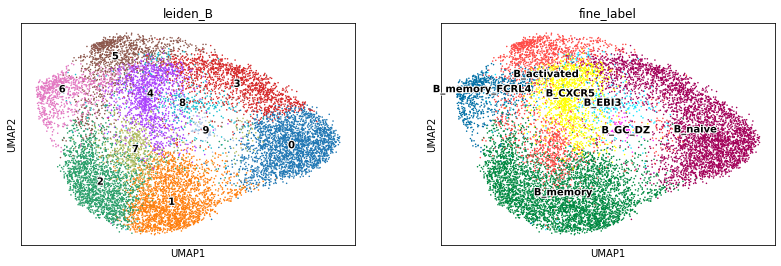

In [41]:
newdict = {'0':'B_naive',
'1':'B_memory',
'2':'B_memory',
'3':'B_naive',
'4':'B_CXCR5',
'5':'B_activated',
'6':'B_memory_FCRL4',
'7':'B_activated',
'8':'B_EBI3',
'9':'B_GC_DZ'}
adata.obs['fine_label'] = [newdict[l] for l in adata.obs['leiden_B']]
sc.pl.umap(adata, color=['leiden_B', 'fine_label'], legend_loc ='on data', legend_fontoutline=2)

... storing 'fine_label' as categorical
... storing 'broad_label' as categorical


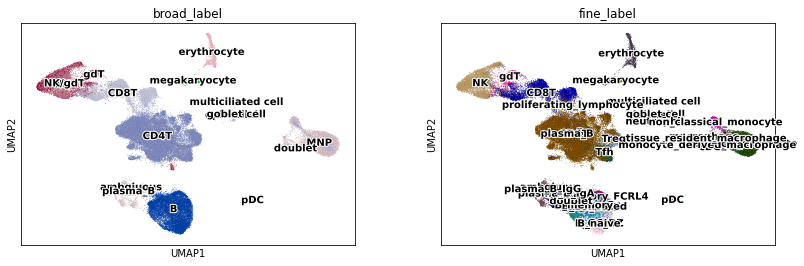

In [42]:
# update the original object
adata_all.obs['broad_label'] = adata_all.obs['broad_label'].astype('object')
adata_all.obs['fine_label'] = adata_all.obs['fine_label'].astype('object')
adata_all.obs['broad_label'].update(adata.obs['broad_label'].astype('object'))
adata_all.obs['fine_label'].update(adata.obs['fine_label'].astype('object'))
adata_all.obs['leiden_B'] = adata.obs['leiden_B']
sc.pl.umap(adata_all, color = ['broad_label', 'fine_label'], legend_loc = 'on data', legend_fontoutline=2)

In [43]:
# save before continuing
adata_all.write('out/adata_combined.h5ad', compression = 'gzip')

### Repeat for plasma cells

In [44]:
adata = adata_all[(adata_all.obs['leiden'].isin(['7']))]
adata

View of AnnData object with n_obs × n_vars = 2333 × 828
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label', 'broad_label', 'leiden_R', 'leiden_label', 'leiden_B'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'age_group_colors', 'cohort_colors', 'gender_colors', 'leiden', 'leiden_R_colors', 'leiden_label_colors', 'neighbors', 'patient_colors', 'pca', 'sampletype_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [45]:
# reset the labels to just call them plasma_B cells for now
adata.obs['broad_label'] = adata.obs['broad_label'].astype('object')
adata.obs['broad_label'] = 'plasma_B'
adata.obs['fine_label'] = adata.obs['fine_label'].astype('object')
adata.obs['fine_label'] = 'plasma_B'

Trying to set attribute `.obs` of view, copying.


In [46]:
# recluster MNPs
adata = sc.AnnData(X = adata.raw.X, obs = adata.obs, var = adata.raw.var, uns = adata.uns, obsm = adata.obsm, obsp = adata.obsp)
adata.raw = adata
adata

AnnData object with n_obs × n_vars = 2333 × 18504
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label', 'broad_label', 'leiden_R', 'leiden_label', 'leiden_B'
    uns: 'age_group_colors', 'cohort_colors', 'gender_colors', 'leiden', 'leiden_R_colors', 'leiden_label_colors', 'neighbors', 'patient_colors', 'pca', 'sampletype_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

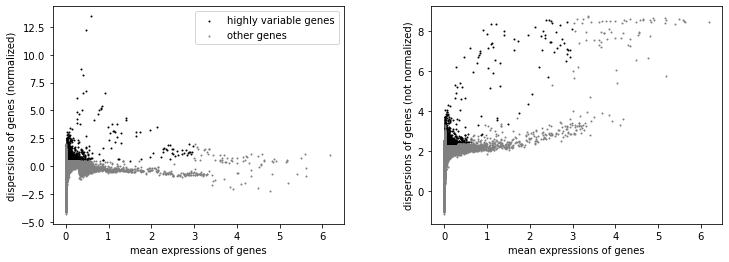

In [47]:
# find highly variable genes
sc.pp.highly_variable_genes(adata, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(adata)

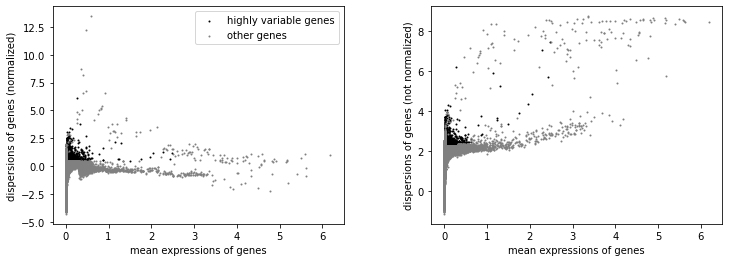

In [48]:
## remove IGHV/IGKV/IGLV from the highly variable genes
import re
for i in adata.var.index:
    if re.search('^IG[HKL]V', i):
        adata.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(adata)

In [49]:
import multiprocessing
# subset to highly variable
adata = adata[:, adata.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'], n_jobs=multiprocessing.cpu_count()-1)
sc.pp.scale(adata, max_value = 10)

Trying to set attribute `.obs` of view, copying.
... storing 'fine_label' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'broad_label' as categorical


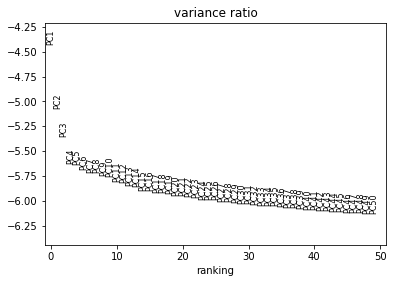

In [50]:
# Principal component analysis
sc.tl.pca(adata, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(adata, log = True, n_pcs = 50)

In [51]:
# run BBKNN
sc.external.pp.bbknn(adata, batch_key = 'patient', n_pcs = 30)

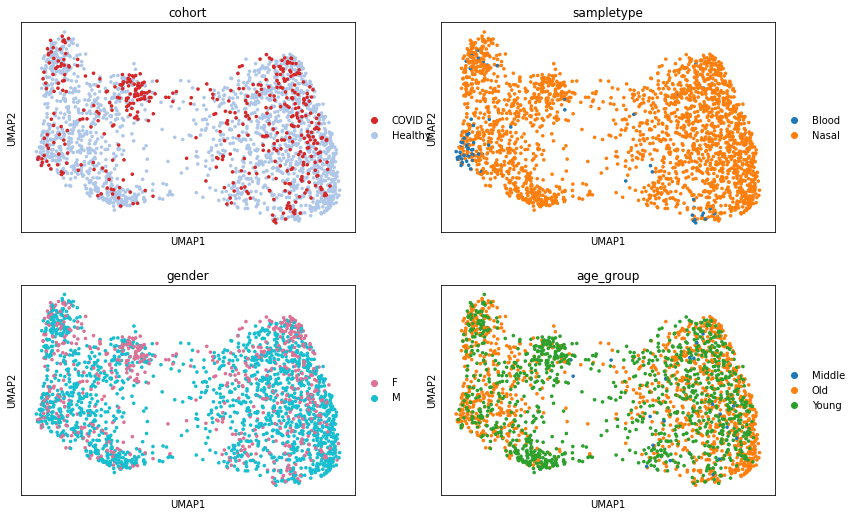

In [52]:
# UMAP
sc.tl.umap(adata, n_components = 2, min_dist = 0.1)
sc.pl.umap(adata, color=['cohort', 'sampletype', 'gender', 'age_group'], ncols =2)

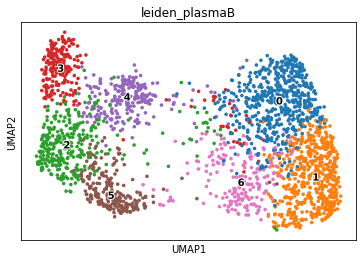

In [53]:
# run clustering
sc.tl.leiden(adata, resolution = 1, key_added = 'leiden_plasmaB')
sc.pl.umap(adata, color=['leiden_plasmaB'], legend_loc = 'on data', legend_fontoutline = 2, color_map = cmp())

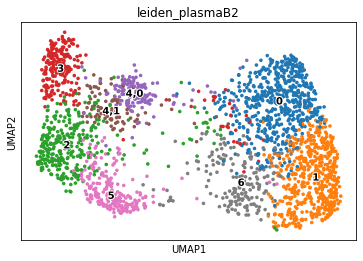

In [54]:
# run clustering
sc.tl.leiden(adata, resolution = .5, key_added = 'leiden_plasmaB2', restrict_to = ('leiden_plasmaB', ['4']))
sc.pl.umap(adata, color=['leiden_plasmaB2'], legend_loc = 'on data', legend_fontoutline = 2, color_map = cmp())

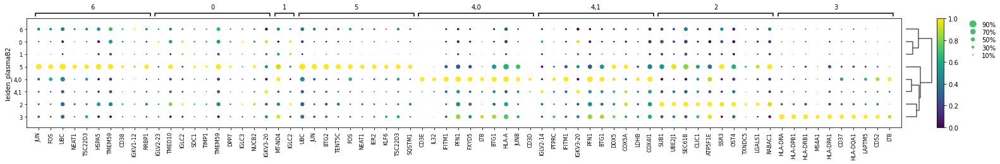

In [55]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden_plasmaB2', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(adata, min_fold_change=1)
sc.tl.dendrogram(adata, groupby = 'leiden_plasmaB2')
sc.pl.rank_genes_groups_dotplot(adata, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

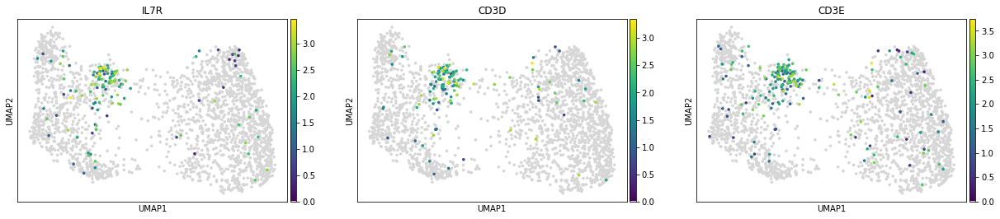

In [56]:
sc.pl.umap(adata, color=['IL7R','CD3D', 'CD3E'], color_map = cmp())

In [57]:
# update the original object to highlight the doublets
adata.obs['broad_label'] = adata.obs['broad_label'].astype('object')
adata.obs['fine_label'] = adata.obs['fine_label'].astype('object')
for i in adata.obs_names:
    if adata.obs.loc[i, 'leiden_plasmaB'] == '4':
        adata.obs.at[i, 'broad_label'] = 'doublet'
        adata.obs.at[i, 'fine_label'] = 'doublet'
# update the original object
adata_all.obs['broad_label'] = adata_all.obs['broad_label'].astype('object')
adata_all.obs['fine_label'] = adata_all.obs['fine_label'].astype('object')
adata_all.obs['broad_label'].update(adata.obs['broad_label'].astype('object'))
adata_all.obs['fine_label'].update(adata.obs['fine_label'].astype('object'))

### Recluster again without the obvious doublets

In [58]:
# subset to B cells
adata = adata_all[adata_all.obs['leiden'].isin(['7'])]
adata = adata[~(adata.obs['broad_label'] == 'doublet')]
adata

View of AnnData object with n_obs × n_vars = 2094 × 828
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label', 'broad_label', 'leiden_R', 'leiden_label', 'leiden_B'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'age_group_colors', 'broad_label_colors', 'cohort_colors', 'fine_label_colors', 'gender_colors', 'leiden', 'leiden_R_colors', 'leiden_label_colors', 'neighbors', 'patient_colors', 'pca', 'sampletype_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [59]:
# recluster MNPs
adata = sc.AnnData(X = adata.raw.X, obs = adata.obs, var = adata.raw.var, uns = adata.uns, obsm = adata.obsm, obsp = adata.obsp)
adata.raw = adata
adata

AnnData object with n_obs × n_vars = 2094 × 18504
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label', 'broad_label', 'leiden_R', 'leiden_label', 'leiden_B'
    uns: 'age_group_colors', 'broad_label_colors', 'cohort_colors', 'fine_label_colors', 'gender_colors', 'leiden', 'leiden_R_colors', 'leiden_label_colors', 'neighbors', 'patient_colors', 'pca', 'sampletype_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

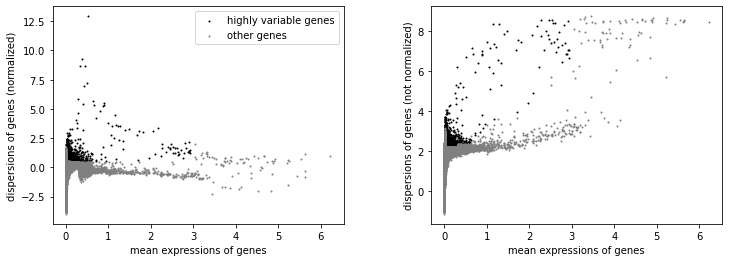

In [60]:
# find highly variable genes
sc.pp.highly_variable_genes(adata, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(adata)

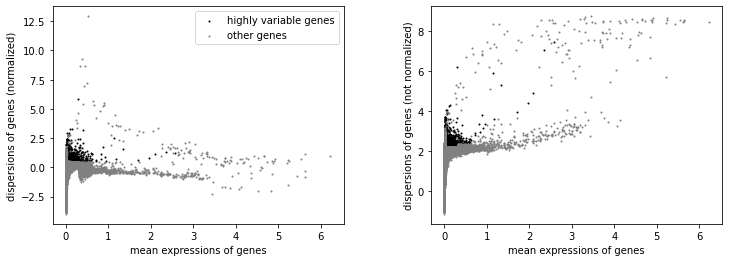

In [61]:
## remove IGHV/IGKV/IGLV from the highly variable genes
import re
for i in adata.var.index:
    if re.search('^IG[HKL]V', i):
        adata.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(adata)

In [62]:
import multiprocessing
# subset to highly variable
adata = adata[:, adata.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'], n_jobs=multiprocessing.cpu_count()-1)
sc.pp.scale(adata, max_value = 10)

Trying to set attribute `.obs` of view, copying.
... storing 'fine_label' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'broad_label' as categorical


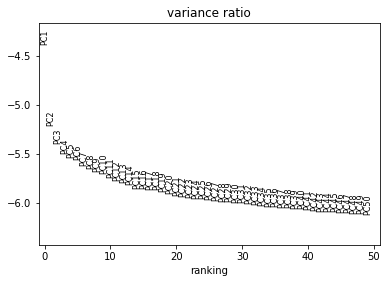

In [63]:
# Principal component analysis
sc.tl.pca(adata, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(adata, log = True, n_pcs = 50)

In [64]:
# run BBKNN
sc.external.pp.bbknn(adata, batch_key = 'patient', n_pcs = 30)

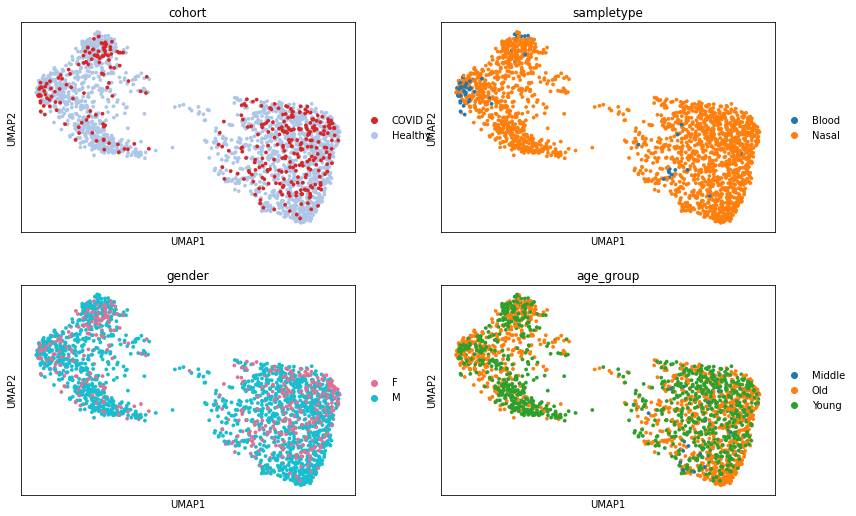

In [65]:
# UMAP
sc.tl.umap(adata, n_components = 2, min_dist = 0.1)
sc.pl.umap(adata, color=['cohort', 'sampletype', 'gender', 'age_group'], ncols =2)

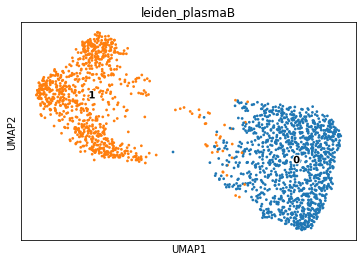

In [66]:
# run clustering
sc.tl.leiden(adata, resolution = .5, key_added = 'leiden_plasmaB')
sc.pl.umap(adata, color=['leiden_plasmaB'], legend_loc = 'on data', legend_fontoutline = 2, size =30)

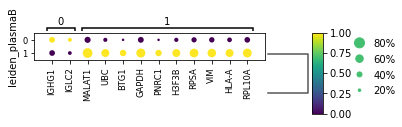

In [67]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden_plasmaB', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(adata, min_fold_change=.5)
sc.tl.dendrogram(adata, groupby = 'leiden_plasmaB')
sc.pl.rank_genes_groups_dotplot(adata, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

It seems that it's not too useful. Try and re-cluster but with the annotated B cells in the mix?

### Recluster with hvgs used when clustering with other B cells

In [68]:
adata = adata_all[adata_all.obs['leiden'].isin(['1', '7'])]
adata = adata[~(adata.obs['broad_label'] == 'doublet')]
adata

View of AnnData object with n_obs × n_vars = 14754 × 828
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label', 'broad_label', 'leiden_R', 'leiden_label', 'leiden_B'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'age_group_colors', 'broad_label_colors', 'cohort_colors', 'fine_label_colors', 'gender_colors', 'leiden', 'leiden_R_colors', 'leiden_label_colors', 'neighbors', 'patient_colors', 'pca', 'sampletype_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [69]:
# recluster MNPs
adata = sc.AnnData(X = adata.raw.X, obs = adata.obs, var = adata.raw.var, uns = adata.uns, obsm = adata.obsm, obsp = adata.obsp)
adata.raw = adata
adata

AnnData object with n_obs × n_vars = 14754 × 18504
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label', 'broad_label', 'leiden_R', 'leiden_label', 'leiden_B'
    uns: 'age_group_colors', 'broad_label_colors', 'cohort_colors', 'fine_label_colors', 'gender_colors', 'leiden', 'leiden_R_colors', 'leiden_label_colors', 'neighbors', 'patient_colors', 'pca', 'sampletype_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

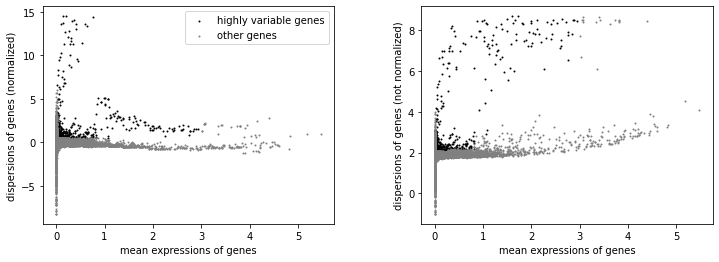

In [70]:
# find highly variable genes
sc.pp.highly_variable_genes(adata, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(adata)

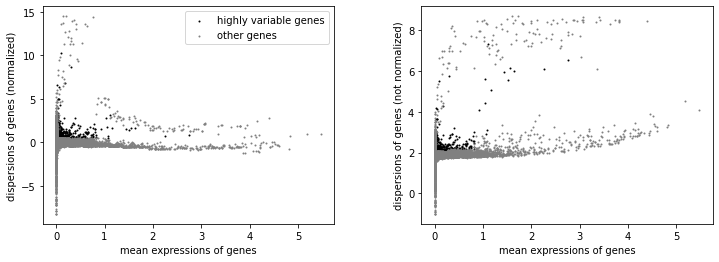

In [71]:
## remove IGHV/IGKV/IGLV from the highly variable genes
import re
for i in adata.var.index:
    if re.search('IG[HKL]V', i):
        adata.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(adata)

In [72]:
import multiprocessing
# subset to highly variable
adata = adata[:, adata.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'], n_jobs=multiprocessing.cpu_count()-1)
sc.pp.scale(adata, max_value = 10)

Trying to set attribute `.obs` of view, copying.
... storing 'fine_label' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'broad_label' as categorical


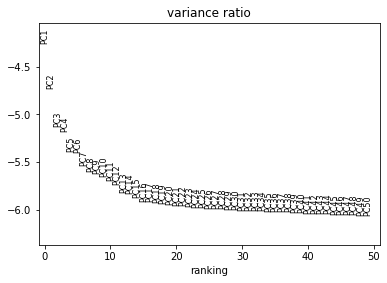

In [73]:
# Principal component analysis
sc.tl.pca(adata, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(adata, log = True, n_pcs = 50)

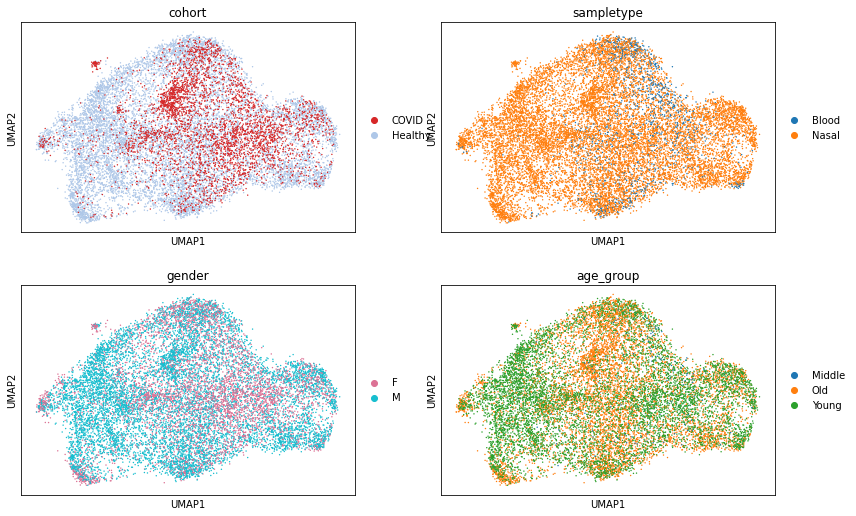

In [74]:
# run BBKNN
sc.external.pp.bbknn(adata, batch_key = 'patient', n_pcs = 30)
# UMAP
sc.tl.umap(adata, n_components = 2, min_dist = 0.1)
sc.pl.umap(adata, color=['cohort', 'sampletype', 'gender', 'age_group'], ncols =2)

In [75]:
# subset to just the plasma cells
adata = adata[adata.obs['leiden'] == '7']
adata

View of AnnData object with n_obs × n_vars = 2094 × 784
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label', 'broad_label', 'leiden_R', 'leiden_label', 'leiden_B'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'age_group_colors', 'cohort_colors', 'gender_colors', 'leiden', 'leiden_R_colors', 'leiden_label_colors', 'neighbors', 'patient_colors', 'pca', 'sampletype_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

Trying to set attribute `.obs` of view, copying.


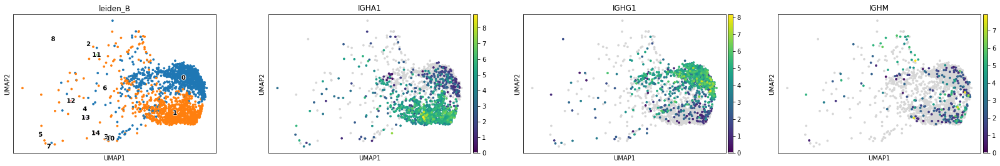

In [76]:
# find_cluster
sc.tl.leiden(adata, key_added = 'leiden_B', resolution = .3)
sc.pl.umap(adata, color=['leiden_B', 'IGHA1', 'IGHG1', 'IGHM'], color_map = cmp(), legend_loc = 'on data', legend_fontoutline=2)

... storing 'fine_label' as categorical
... storing 'broad_label' as categorical
... storing 'leiden_B' as categorical


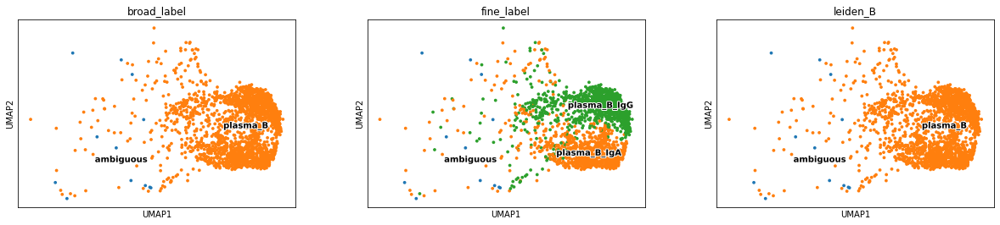

In [77]:
# we wil keep keep only 0 and 1, and mark the rest as ambiguous
newdict1 = {'0':'plasma_B_IgG',
'1':'plasma_B_IgA',
'2':'ambiguous',
'3':'ambiguous',
'4':'ambiguous',
'5':'ambiguous',
'6':'ambiguous',
'7':'ambiguous',
'8':'ambiguous',
'9':'ambiguous',
'10':'ambiguous',
'11':'ambiguous',
'12':'ambiguous',
'13':'ambiguous',
'14':'ambiguous'}
newdict2 = {'0':'plasma_B',
'1':'plasma_B',
'2':'ambiguous',
'3':'ambiguous',
'4':'ambiguous',
'5':'ambiguous',
'6':'ambiguous',
'7':'ambiguous',
'8':'ambiguous',
'9':'ambiguous',
'10':'ambiguous',
'11':'ambiguous',
'12':'ambiguous',
'13':'ambiguous',
'14':'ambiguous'}
newdict3 = {'0':'10,0',
'1':'10,1',
'2':'ambiguous',
'3':'ambiguous',
'4':'ambiguous',
'5':'ambiguous',
'6':'ambiguous',
'7':'ambiguous',
'8':'ambiguous',
'9':'ambiguous',
'10':'ambiguous',
'11':'ambiguous',
'12':'ambiguous',
'13':'ambiguous',
'14':'ambiguous'}
adata.obs['fine_label'] = [newdict1[l] for l in adata.obs['leiden_B']] 
adata.obs['broad_label'] = [newdict2[l] for l in adata.obs['leiden_B']]
adata.obs['leiden_B'] = [newdict2[l] for l in adata.obs['leiden_B']]
sc.pl.umap(adata, color=['broad_label', 'fine_label', 'leiden_B'], legend_loc = 'on data', legend_fontoutline=2)

In [78]:
# update the original object
adata_all.obs['broad_label'] = adata_all.obs['broad_label'].astype('object')
adata_all.obs['fine_label'] = adata_all.obs['fine_label'].astype('object')
adata_all.obs['leiden_B'] = adata_all.obs['leiden_B'].astype('object')
adata_all.obs['broad_label'].update(adata.obs['broad_label'].astype('object'))
adata_all.obs['fine_label'].update(adata.obs['fine_label'].astype('object'))
adata_all.obs['leiden_B'].update(adata.obs['leiden_B'].astype('object'))

... storing 'fine_label' as categorical
... storing 'broad_label' as categorical
... storing 'leiden_B' as categorical


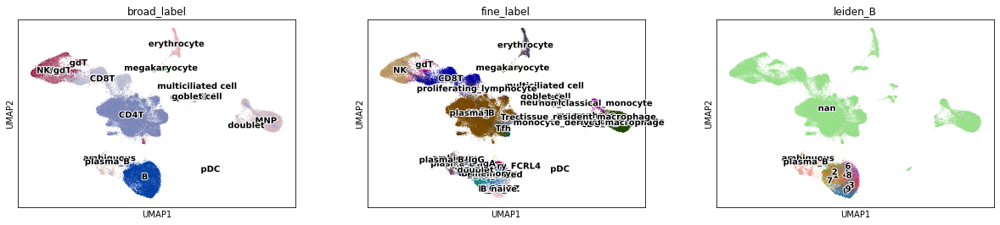

In [79]:
sc.pl.umap(adata_all, color = ['broad_label', 'fine_label', 'leiden_B'], legend_loc = 'on data', legend_fontoutline=2)

### Check that the labeling worked

In [80]:
adata = adata_all[adata_all.obs['leiden'].isin(['1', '7'])]
adata = adata[~(adata.obs['broad_label'].isin(['doublet', 'ambiguous']))]
adata

View of AnnData object with n_obs × n_vars = 14741 × 828
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label', 'broad_label', 'leiden_R', 'leiden_label', 'leiden_B'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'age_group_colors', 'cohort_colors', 'gender_colors', 'leiden', 'leiden_B_colors', 'leiden_R_colors', 'leiden_label_colors', 'neighbors', 'patient_colors', 'pca', 'sampletype_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [81]:
# recluster MNPs
adata = sc.AnnData(X = adata.raw.X, obs = adata.obs, var = adata.raw.var, uns = adata.uns, obsm = adata.obsm, obsp = adata.obsp)
adata.raw = adata
adata

AnnData object with n_obs × n_vars = 14741 × 18504
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'batch', 'leiden', '__is_in_cluster__', 'fine_label', 'broad_label', 'leiden_R', 'leiden_label', 'leiden_B'
    uns: 'age_group_colors', 'cohort_colors', 'gender_colors', 'leiden', 'leiden_B_colors', 'leiden_R_colors', 'leiden_label_colors', 'neighbors', 'patient_colors', 'pca', 'sampletype_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

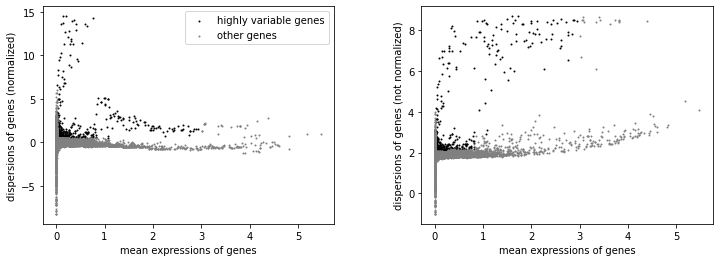

In [82]:
# find highly variable genes
sc.pp.highly_variable_genes(adata, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(adata)

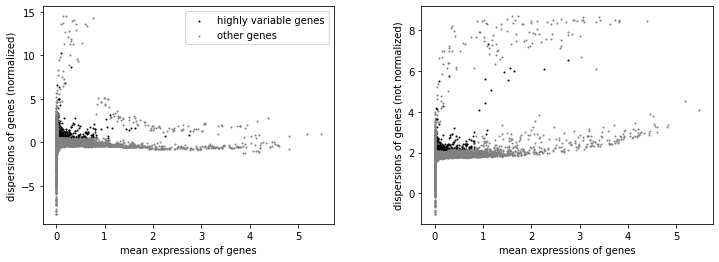

In [83]:
## remove IGHV/IGKV/IGLV from the highly variable genes
import re
for i in adata.var.index:
    if re.search('IG[HKL]V', i):
        adata.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(adata)

In [84]:
import multiprocessing
# subset to highly variable
adata = adata[:, adata.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'], n_jobs=multiprocessing.cpu_count()-1)
sc.pp.scale(adata, max_value = 10)

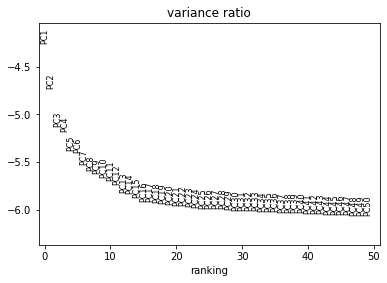

In [85]:
# Principal component analysis
sc.tl.pca(adata, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(adata, log = True, n_pcs = 50)

In [86]:
# run BBKNN
sc.external.pp.bbknn(adata, batch_key = 'patient', n_pcs = 30)

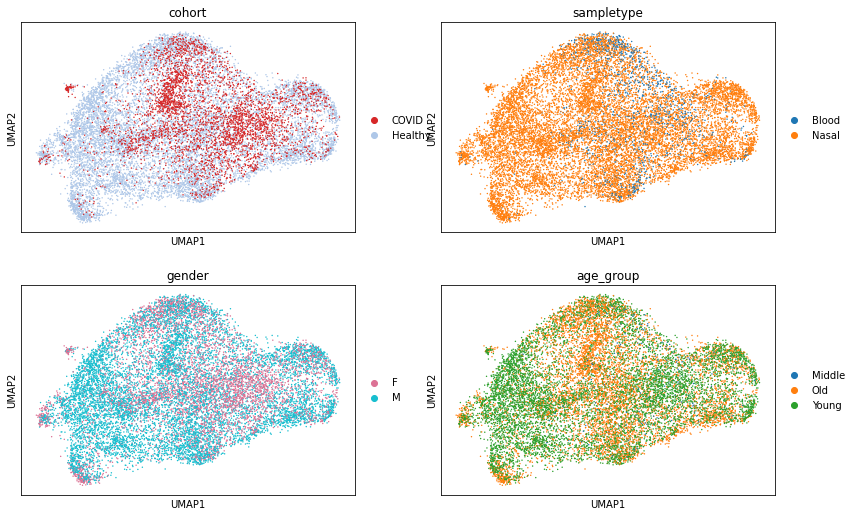

In [87]:
# UMAP
sc.tl.umap(adata, n_components = 2, min_dist = 0.1)
sc.pl.umap(adata, color=['cohort', 'sampletype', 'gender', 'age_group'], ncols =2)

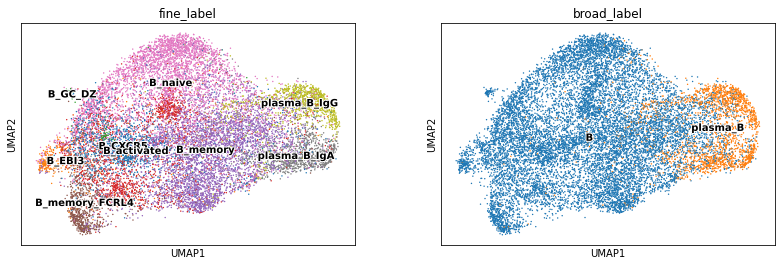

In [88]:
sc.pl.umap(adata, color=['fine_label', 'broad_label'], legend_loc ='on data', legend_fontoutline=2)

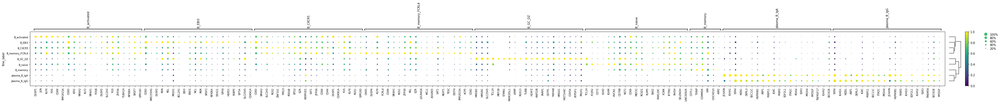

In [89]:
sc.tl.rank_genes_groups(adata, groupby = 'fine_label', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(adata, min_fold_change=1)
sc.tl.dendrogram(adata, groupby = 'fine_label')
sc.pl.rank_genes_groups_dotplot(adata, n_genes = 20, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

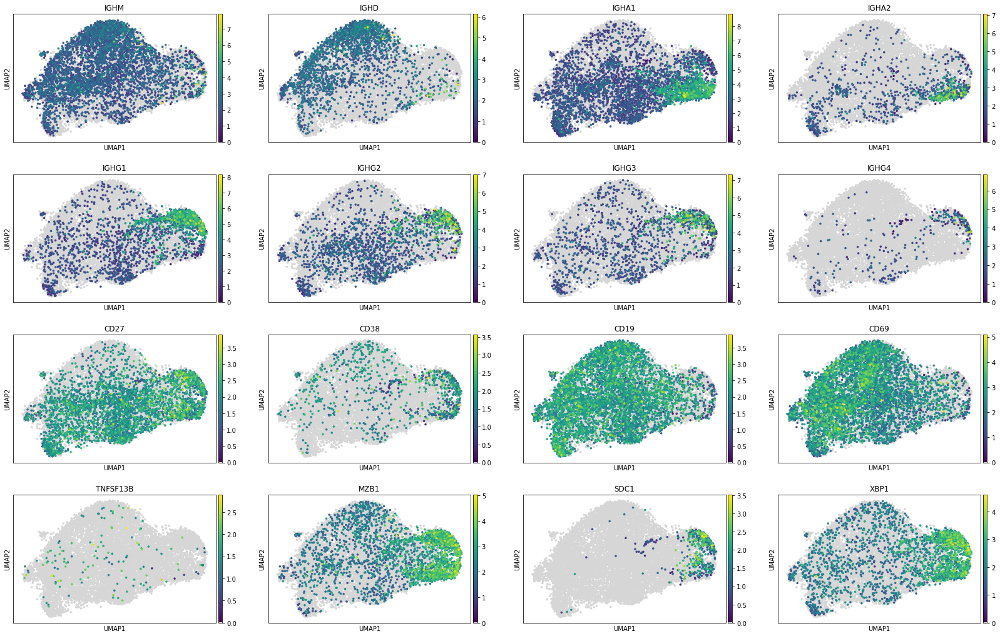

In [90]:
sc.pl.umap(adata, color=['IGHM', 'IGHD', 'IGHA1', 'IGHA2', 'IGHG1', 'IGHG2', 'IGHG3', 'IGHG4', 'CD27', 'CD38', 'CD19', 'CD69',  'TNFSF13B', 'MZB1', 'SDC1', 'XBP1'], color_map = cmp(), size = 50)

In [95]:
adata_all.obs['broad_label'] = adata_all.obs['broad_label'].astype('object')
adata_all.obs['fine_label'] = adata_all.obs['fine_label'].astype('object')
adata_all.obs.at['Sample_Fq_9_CAAGAAAGTAGGAGTC-0', 'broad_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq_11_ACACCAACAGCTCGCA-0', 'broad_label'] = 'epithelial'
adata_all.obs.at['Sample_Fq2_TCGCGTTCACTTAAGC-1', 'broad_label'] = 'CD8T'
adata_all.obs.at['Sample_Fq5_ACATCAGCACAGCCCA-1', 'broad_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_ACTGTCCGTCCGCTGA-1', 'broad_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_AGCATACGTATCAGTC-1', 'broad_label'] = 'CD8T'
adata_all.obs.at['Sample_Fq5_AGGGATGGTGTCTGAT-1', 'broad_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_AGGTCCGAGAGTGAGA-1', 'broad_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_CACTCCAGTCATGCCG-1', 'broad_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_ACAGCCGAGCACCGCT-1', 'broad_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_CAGAATCCACCTTGTC-1', 'broad_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_CAGCTAATCTCGGACG-1', 'broad_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_CTGCCTATCTATCGCC-1', 'broad_label'] = 'CD8T'
adata_all.obs.at['Sample_Fq5_GATGAGGGTAGAGGAA-1', 'broad_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_GGCTCGATCCGTCAAA-1', 'broad_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_GTGGGTCTCAACTCTT-1', 'broad_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_TCGCGAGCACGTAAGG-1', 'broad_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_TGCTACCAGACTAGAT-1', 'broad_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq6_AGACGTTGTGCAGACA-1', 'broad_label'] = 'doublet'
adata_all.obs.at['Sample_Fq6_TGCGGGTGTTCCACGG-1', 'broad_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq_9_CAAGAAAGTAGGAGTC-0', 'fine_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq_11_ACACCAACAGCTCGCA-0', 'fine_label'] = 'epithelial'
adata_all.obs.at['Sample_Fq2_TCGCGTTCACTTAAGC-1', 'fine_label'] = 'CD8T'
adata_all.obs.at['Sample_Fq5_ACATCAGCACAGCCCA-1', 'fine_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_ACTGTCCGTCCGCTGA-1', 'fine_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_AGCATACGTATCAGTC-1', 'fine_label'] = 'CD8T'
adata_all.obs.at['Sample_Fq5_AGGGATGGTGTCTGAT-1', 'fine_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_AGGTCCGAGAGTGAGA-1', 'fine_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_CACTCCAGTCATGCCG-1', 'fine_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_ACAGCCGAGCACCGCT-1', 'fine_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_CAGAATCCACCTTGTC-1', 'fine_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_CAGCTAATCTCGGACG-1', 'fine_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_CTGCCTATCTATCGCC-1', 'fine_label'] = 'CD8T'
adata_all.obs.at['Sample_Fq5_GATGAGGGTAGAGGAA-1', 'fine_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_GGCTCGATCCGTCAAA-1', 'fine_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_GTGGGTCTCAACTCTT-1', 'fine_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_TCGCGAGCACGTAAGG-1', 'fine_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq5_TGCTACCAGACTAGAT-1', 'fine_label'] = 'CD4T'
adata_all.obs.at['Sample_Fq6_AGACGTTGTGCAGACA-1', 'fine_label'] = 'doublet'
adata_all.obs.at['Sample_Fq6_TGCGGGTGTTCCACGG-1', 'fine_label'] = 'CD4T'

In [91]:
# save before continuing
adata_all.write('out/adata_combined.h5ad', compression = 'gzip')

In [92]:
# save the B cells too
adata.write('out/adata_bcells.h5ad', compression = 'gzip')

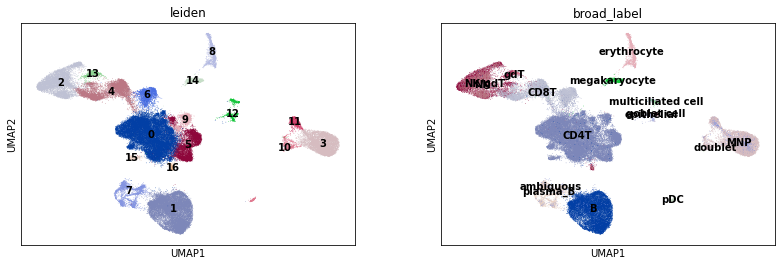

In [93]:
sc.pl.umap(adata_all, color = ['leiden', 'broad_label'], legend_loc = 'on data')

In [ ]:
for i in ['Sample_Fq_9_CAAGAAAGTAGGAGTC-0', 'Sample_Fq_11_ACACCAACAGCTCGCA-0', 'Sample_Fq2_TCGCGTTCACTTAAGC-1', 'Sample_Fq5_ACATCAGCACAGCCCA-1', 'Sample_Fq5_ACTGTCCGTCCGCTGA-1', 'Sample_Fq5_AGCATACGTATCAGTC-1', 'Sample_Fq5_AGGGATGGTGTCTGAT-1', 'Sample_Fq5_AGGTCCGAGAGTGAGA-1', 'Sample_Fq5_CACTCCAGTCATGCCG-1', 'Sample_Fq5_ACAGCCGAGCACCGCT-1', 'Sample_Fq5_CAGAATCCACCTTGTC-1', 'Sample_Fq5_CAGCTAATCTCGGACG-1', 'Sample_Fq5_CTGCCTATCTATCGCC-1', 'Sample_Fq5_GATGAGGGTAGAGGAA-1', 'Sample_Fq5_GGCTCGATCCGTCAAA-1', 'Sample_Fq5_GTGGGTCTCAACTCTT-1', 'Sample_Fq5_TCGCGAGCACGTAAGG-1', 'Sample_Fq5_TGCTACCAGACTAGAT-1', 'Sample_Fq6_AGACGTTGTGCAGACA-1', 'Sample_Fq6_TGCGGGTGTTCCACGG-1']:
    adata_all.obs.at[i, 'fine_label'] = 'ambiguous'
    adata_all.obs.at[i, 'fine_label'] = 'ambiguous'